In [21]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch

def patch_timm_vit_to_cache_attention(vit):
    """
    Patch timm ViT blocks so each block.attn stores:
      block.attn.last_attn : (B, heads, N, N)
    and is compatible with timm's signature attn(x, attn_mask=None).
    """
    for blk in vit.blocks:
        attn = blk.attn

        # Skip if already patched
        if hasattr(attn, "last_attn"):
            continue

        def forward_with_cache(x, attn_mask=None, attn_module=attn):
            B, N, C = x.shape

            qkv = attn_module.qkv(x)
            qkv = qkv.reshape(B, N, 3, attn_module.num_heads, C // attn_module.num_heads)
            qkv = qkv.permute(2, 0, 3, 1, 4)  # (3, B, heads, N, head_dim)
            q, k, v = qkv[0], qkv[1], qkv[2]

            attn_scores = (q @ k.transpose(-2, -1)) * attn_module.scale  # (B, heads, N, N)

            # Apply attention mask if provided (timm passes various formats)
            # Common cases:
            # - None
            # - (B, 1, N, N) or (B, heads, N, N) additive mask
            # - (N, N) or broadcastable
            if attn_mask is not None:
                # Convert bool mask to additive mask if needed
                if attn_mask.dtype == torch.bool:
                    # True means "keep"? In many implementations True means "masked".
                    # timm uses additive masks in some paths; we’ll treat True as masked.
                    attn_scores = attn_scores.masked_fill(attn_mask, float("-inf"))
                else:
                    # Assume additive (e.g., 0 for keep, -inf for mask)
                    attn_scores = attn_scores + attn_mask

            attn_probs = attn_scores.softmax(dim=-1)
            attn_module.last_attn = attn_probs  # cache before dropout

            attn_probs = attn_module.attn_drop(attn_probs)
            x_out = (attn_probs @ v).transpose(1, 2).reshape(B, N, C)
            x_out = attn_module.proj(x_out)
            x_out = attn_module.proj_drop(x_out)
            return x_out

        attn.forward = forward_with_cache

    return vit

@torch.no_grad()
def attention_rollout_map(vit, x, head_fusion="mean", start_layer=0):
    _ = vit(x)  # populates blk.attn.last_attn

    attn_mats = []
    for blk in vit.blocks:
        A = blk.attn.last_attn  # (B, heads, N, N)
        A = A.mean(dim=1) if head_fusion == "mean" else A.max(dim=1).values
        attn_mats.append(A)

    B, N, _ = attn_mats[0].shape
    I = torch.eye(N, device=x.device).unsqueeze(0).expand(B, N, N)

    joint = None
    for i, A in enumerate(attn_mats):
        if i < start_layer:
            continue
        A = A + I
        A = A / (A.sum(dim=-1, keepdim=True) + 1e-6)
        joint = A if joint is None else (A @ joint)

    cls_to_patches = joint[:, 0, 1:]
    num_patches = cls_to_patches.shape[-1]
    grid = int(num_patches ** 0.5)
    attn_grid = cls_to_patches.reshape(B, 1, grid, grid)

    attn_up = torch.nn.functional.interpolate(attn_grid, size=x.shape[-2:], mode="bilinear", align_corners=False)
    attn_up = attn_up - attn_up.amin(dim=(-2, -1), keepdim=True)
    attn_up = attn_up / (attn_up.amax(dim=(-2, -1), keepdim=True) + 1e-6)
    return attn_up


# -----------------------------
# 3) Simple image loading + preprocessing
# -----------------------------
def load_cxr_as_tensor(path, img_size=224):
    """
    Returns: (1,3,H,W) float tensor in [0,1]
    IMPORTANT: replace normalization with whatever you used in training.
    """
    img = Image.open(path).convert("RGB")
    img = img.resize((img_size, img_size))

    x = torch.from_numpy(np.array(img)).float() / 255.0  # (H,W,3)
    x = x.permute(2, 0, 1).unsqueeze(0)  # (1,3,H,W)

    # If your training used normalization, apply it here.
    # Example (ImageNet norm) — ONLY use if you trained with it:
    # mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)
    # std  = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)
    # x = (x - mean) / std

    return x

# -----------------------------
# 4) Visualization helpers
# -----------------------------
def to_gray01(x_1x3hw):
    x = x_1x3hw.detach().cpu().float()[0]
    x = x.mean(dim=0)  # (H,W)
    x = x - x.min()
    x = x / (x.max() + 1e-6)
    return x.numpy()

def to_mask01(m_1x1hw):
    m = m_1x1hw.detach().cpu().float()[0, 0]
    m = m - m.min()
    m = m / (m.max() + 1e-6)
    return m.numpy()

def visualize_attn_triplet(x, attn_mae, attn_pacx, suptitle=""):
    img = to_gray01(x)
    mae = to_mask01(attn_mae)
    pacx = to_mask01(attn_pacx)

    diff = pacx - mae
    diff = diff / (np.max(np.abs(diff)) + 1e-6)  # [-1,1] roughly

    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
    if suptitle:
        fig.suptitle(suptitle)

    axes[0].imshow(img, cmap="gray")
    axes[0].set_title("CXR")
    axes[0].axis("off")

    axes[1].imshow(img, cmap="gray")
    axes[1].imshow(mae, cmap="magma", alpha=0.45)
    axes[1].set_title("MAE attention (rollout)")
    axes[1].axis("off")

    axes[2].imshow(img, cmap="gray")
    axes[2].imshow(pacx, cmap="magma", alpha=0.45)
    axes[2].set_title("PACX attention (rollout)")
    axes[2].axis("off")

    axes[3].imshow(img, cmap="gray")
    axes[3].imshow(diff, cmap="seismic", alpha=0.55, vmin=-1, vmax=1)
    axes[3].set_title("Diff (PACX − MAE)")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()


device = "cuda" if torch.cuda.is_available() else "cpu"

# Your model init
mae_model = CXRModel(
    num_classes=1,
    mode="mae",
    model_checkpoints="../../scratch/checkpoints/mae/last.ckpt"
)
pacx_model = CXRModel(
    num_classes=1,
    mode="pacx",  # keep as you wrote; if PACX uses a different mode, change it
    model_checkpoints="../../scratch/checkpoints/PACX-Sweep-LRWD/Run10_BS250_LR1e-4_WD0.05.ckpt"
)

mae_model.eval().to(device)
pacx_model.eval().to(device)


Missing keys: []
Unexpected keys: ['mask_token']


CXRModel(
  (backbone): MAECXREncoder(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (q_norm): Identity()
          (k_norm): Identity()
          (attn_drop): Dropout(p=0.0, inplace=False)
          (norm): Identity()
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (ls1): Identity()
        (drop_path1): Identity()
        (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (drop1): Dropout(p=0.0, inplace=False)
          (norm): Id

In [22]:
import torch
import pandas as pd
from tqdm import tqdm

from Data.data_modules import CXRDataModule
from Models.models import CXRModel  # your class
import os
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import pandas as pd
import torch
import torchvision.transforms as T
# -----------------------------
# 0) Setup: datamodule (TEST ONLY)
# -----------------------------
class_names = ["composite_slvh_dlv"]
num_classes = 1
task_type = "binary"

class ChestXrayDataset(Dataset):
    def __init__(self, df, root_dir, labels = [], path_index = "Path"):
        self.df = df
        self.root_dir = root_dir
        self.path_index = path_index
        self.image_size = 224
        self.val_transform = T.Compose([
                    T.Resize((self.image_size, self.image_size)),
                    T.ToTensor(),
                    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                ])

        if labels is not None and len(labels) > 0:
            self.label_cols = labels
            self.with_labels = True

            # Convert to numeric
            self.df[self.label_cols] = self.df[self.label_cols].apply(
                pd.to_numeric, errors="coerce"
            )

            # Detect NaNs BEFORE filling
            for col in self.label_cols:
                nan_idx = self.df[self.df[col].isna()].index.tolist()
                if len(nan_idx) > 0:
                    print(f"[WARNING] Column '{col}' contains NaN at indices: {nan_idx[:10]} "
                        f"(showing first 10). Total = {len(nan_idx)}")

            # Fill NaNs
            self.df[self.label_cols] = self.df[self.label_cols].fillna(0).astype("int64")

            # Verify again after fill
            for col in self.label_cols:
                if self.df[col].isna().any():
                    raise ValueError(f"[ERROR] Column '{col}' STILL contains NaNs after fill().")
        else:
            self.with_labels = False

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img_path = os.path.join(self.root_dir, row[self.path_index])
        image = Image.open(img_path).convert("RGB")
        image = self.val_transform(image)
        labels_np = row[self.label_cols].to_numpy(dtype="float32")
        labels = torch.from_numpy(labels_np)

        return image, labels, img_path

test_dataset = ChestXrayDataset(
                df=pd.read_csv("./src/chexchonet_test.csv"),
                root_dir="./src/chex/images",
                labels=['composite_slvh_dlv'],
                path_index="cxr_filename"
            )

test_dataloader = DataLoader(
            test_dataset,
            batch_size=256,
            num_workers=6,
            shuffle=False,
            persistent_workers=True,
            pin_memory=True
        )

@torch.no_grad()
def predict_probs(model, imgs):
    logits = model(imgs)
    if logits.ndim == 2 and logits.shape[1] == 1:
        logits = logits.squeeze(1)   # [B]
    elif logits.ndim == 2 and logits.shape[1] > 1:
        # multi-class would be softmax; for your binary task we expect 1 logit
        raise ValueError(f"Unexpected logits shape: {logits.shape}")
    probs = torch.sigmoid(logits)    # [B]
    preds = (probs >= 0.5).int()
    return probs, preds

def flatten_targets(targets):
    # targets can be [B], [B,1], or dict/tuple depending on your dataset
    if isinstance(targets, dict):
        # common pattern: targets["labels"] or targets[class_names[0]]
        if "labels" in targets:
            y = targets["labels"]
        else:
            y = targets[class_names[0]]
    else:
        y = targets
    if y.ndim == 2 and y.shape[1] == 1:
        y = y.squeeze(1)
    return y.int()

# -----------------------------
# 3) Run test set: collect preds + labels
# -----------------------------
pacx_rescue_paths = []   # THIS is what you want

mae_model.eval()
pacx_model.eval()

with torch.no_grad():
    for imgs, targets, paths in tqdm(test_dataloader, desc="Finding PACX rescues"):
        imgs = imgs.to(device, non_blocking=True)
        y = targets.squeeze(1).int().to(device)   # [B]

        pos_mask = (y == 1)
        if pos_mask.sum() == 0:
            continue  # no positives in this batch

        imgs_pos = imgs[pos_mask]
        y_pos = y[pos_mask]
        paths_pos = [paths[i] for i in torch.where(pos_mask)[0].tolist()]

        # --------------------------------------------------
        # 2) MAE forward (positives only)
        # --------------------------------------------------
        logits_mae = mae_model(imgs_pos).squeeze(1)
        probs_mae = torch.sigmoid(logits_mae)
        preds_mae = (probs_mae >= 0.5).int()

        # --------------------------------------------------
        # 3) PACX forward (positives only)
        # --------------------------------------------------
        logits_pacx = pacx_model(imgs_pos).squeeze(1)
        probs_pacx = torch.sigmoid(logits_pacx)
        preds_pacx = (probs_pacx >= 0.5).int()

        # --------------------------------------------------
        # 4) rescue condition
        #    MAE wrong (predicts 0), PACX right (predicts 1)
        # --------------------------------------------------
        mae_wrong = (preds_mae == 0)
        pacx_right = (preds_pacx == 1)

        rescue_mask = mae_wrong & pacx_right

        # --------------------------------------------------
        # 5) collect paths
        # --------------------------------------------------
        for i in torch.where(rescue_mask)[0]:
            pacx_rescue_paths.append(paths_pos[i])

Finding PACX rescues:   0%|          | 0/56 [00:00<?, ?it/s]/users/yliu802/miniconda3/envs/SSL/lib/python3.10/site-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
Finding PACX rescues: 100%|██████████| 56/56 [02:06<00:00,  2.26s/it]


In [23]:
print("Total PACX rescue positives:", len(pacx_rescue_paths))
print("Example paths:")
for p in pacx_rescue_paths[:5]:
    print(p)


Total PACX rescue positives: 550
Example paths:
./src/chex/images/a414de802b79748d5111294b4154bfe8_14af727d.jpg
./src/chex/images/28cb086e3c649dacff7fdab9abfda1a9_7f865451.jpg
./src/chex/images/00404d217f6a0a0f6a3a1cb63fd5c243_a5694edf.jpg
./src/chex/images/ec358155730ab65f3419b7d3b76d75e8_0a5a8738.jpg
./src/chex/images/c493f74090eecb591786d2f4409b6067_1695caf3.jpg


[1/10] Visualizing: ./src/chex/images/ccad2a1a8e2c8be7e85c1cfc0da9c7b4_ef48bdb2.jpg


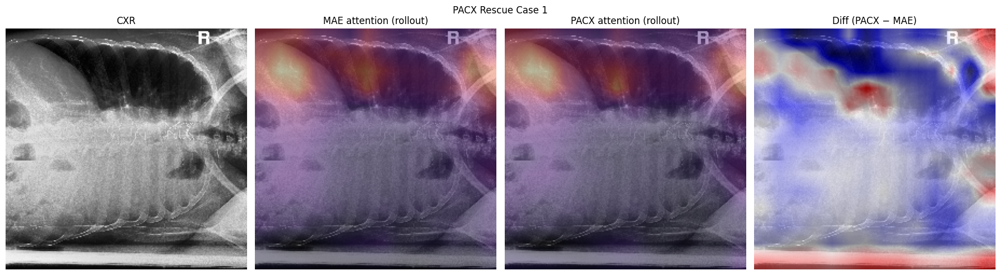

[2/10] Visualizing: ./src/chex/images/afc8829ae7d80333dcb0099eef9aa718_b7ec00bd.jpg


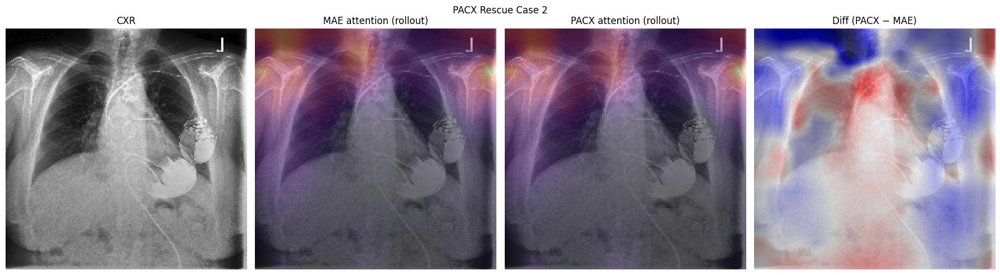

[3/10] Visualizing: ./src/chex/images/5db2cfb9d89b9f6af90f4e83c727e006_3908f24e.jpg


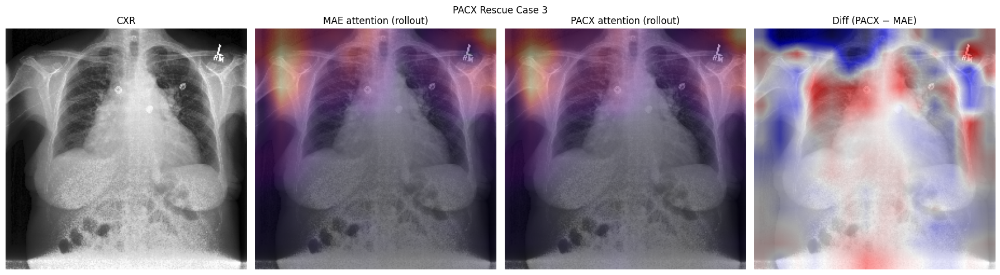

[4/10] Visualizing: ./src/chex/images/7595608025cc1f194202c63b3dc4fd29_1e928289.jpg


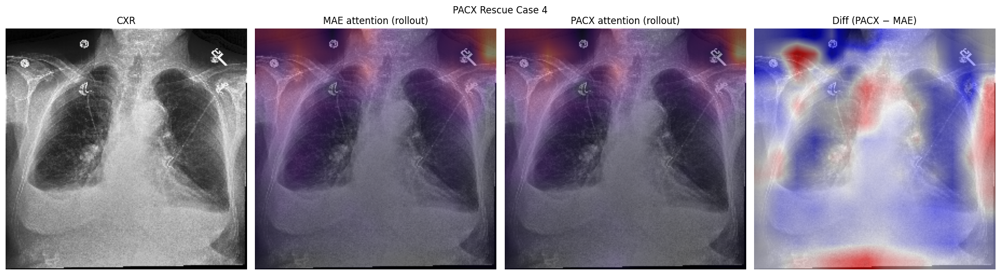

[5/10] Visualizing: ./src/chex/images/5ac0a63991ee767a0b57521722cc51da_9fb6539e.jpg


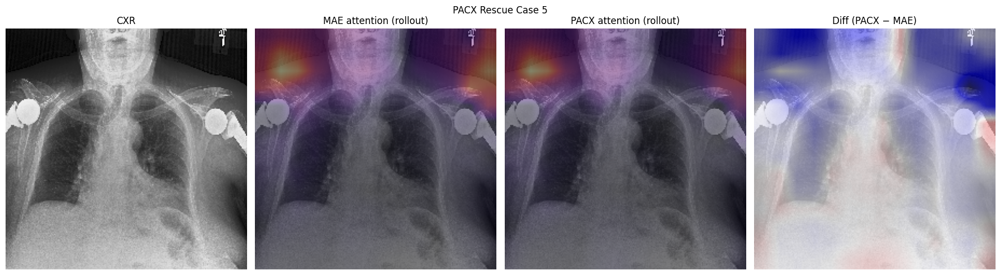

[6/10] Visualizing: ./src/chex/images/ebc468d4a8180c8ae93ed45d9bacb0e4_345fa84b.jpg


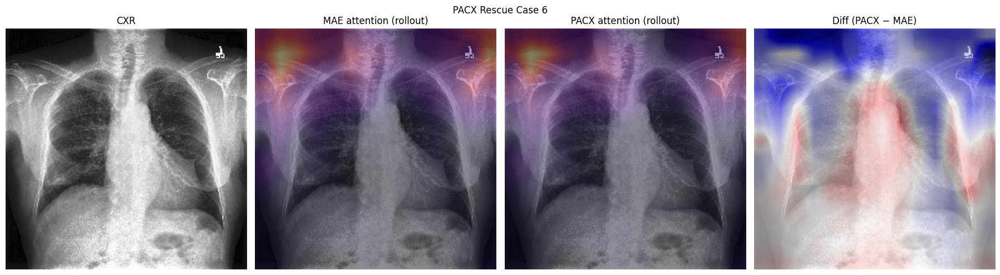

[7/10] Visualizing: ./src/chex/images/9275d80dc4d34c0a827c046f5a188307_42209d8b.jpg


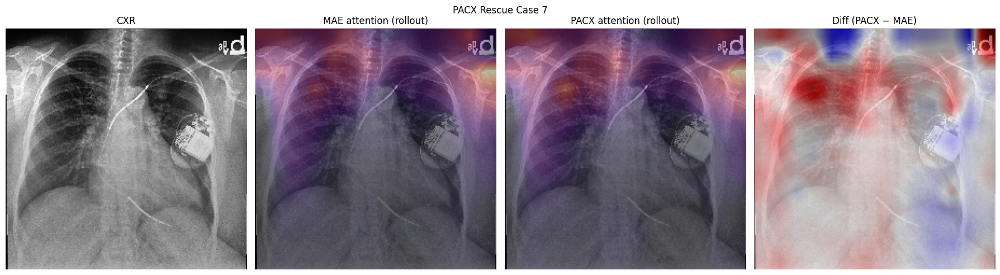

[8/10] Visualizing: ./src/chex/images/00b3f068de9351d94b4f98942669a605_a35012f2.jpg


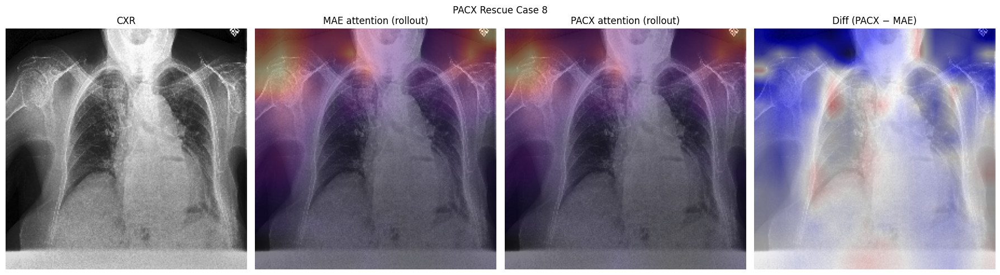

[9/10] Visualizing: ./src/chex/images/26ca5ac542c5be3f4effd92d33a39679_18ae806e.jpg


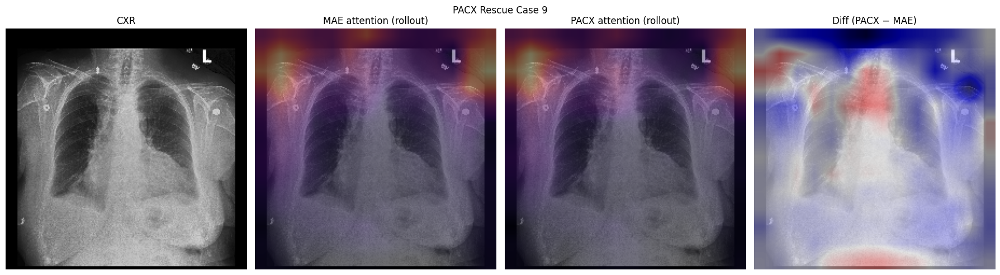

[10/10] Visualizing: ./src/chex/images/549001e5f673e0881e5a4f0fe24f0295_7683f62a.jpg


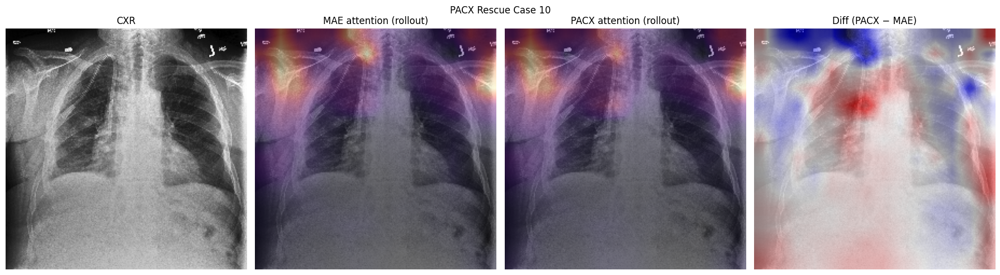

In [25]:
import random

random.seed(42)

# pacx_rescue_paths: list[str]
n_vis = 10
vis_paths = random.sample(
    pacx_rescue_paths,
    k=min(n_vis, len(pacx_rescue_paths))
)

# Patch both backbones ONCE (do NOT do this inside the loop)
patch_timm_vit_to_cache_attention(mae_model.backbone)
patch_timm_vit_to_cache_attention(pacx_model.backbone)

mae_model.eval()
pacx_model.eval()

for i, cxr_path in enumerate(vis_paths):
    print(f"[{i+1}/{len(vis_paths)}] Visualizing:", cxr_path)

    # Load image
    x = load_cxr_as_tensor(cxr_path, img_size=224).to(device)

    # Attention rollout
    attn_mae = attention_rollout_map(
        mae_model.backbone, x,
        head_fusion="mean",
        start_layer=0   # try 6 / 8 / 12 later
    )

    attn_pacx = attention_rollout_map(
        pacx_model.backbone, x,
        head_fusion="mean",
        start_layer=0
    )

    # Visualize
    visualize_attn_triplet(
        x,
        attn_mae,
        attn_pacx,
        suptitle=f"PACX Rescue Case {i+1}"
    )